## Import Package

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import scipy.io
import keras
from keras import regularizers
from keras.models import Sequential
from keras.layers import Dropout, Dense
from keras.optimizers import RMSprop, Adam
from keras.layers import LSTM, Activation, CuDNNLSTM
from sklearn.preprocessing import MinMaxScaler
from keras.models import load_model
#from sklearn.externals import joblib  # save scaler
import joblib
import time
from random import shuffle
import os
from scipy.stats import norm
import eqsig.single


Using TensorFlow backend.


In [2]:
print('無基線修正總data:914')
print('有基線修正總data:718')
print('無基線修正總data:914, train:639, test:275')
print('有基線修正總data:718, train:502, test:216')
print('training set:1141, testing:491')


無基線修正總data:914
有基線修正總data:718
無基線修正總data:914, train:639, test:275
有基線修正總data:718, train:502, test:216
training set:1141, testing:491


## Load Spectrum Data
將分類後表現好與差的地震反應譜資料匯入

In [3]:
dataDir = r'E:\\我的雲端硬碟\\AI center intern\\nonlinear_seismic_response_analysis\\August\\0.2g_Earthquake\\' 
resultDir = r'E:\\我的雲端硬碟\\AI center intern\\nonlinear_seismic_response_analysis\\August\\0.2g_Earthquake\\Disp\\0.2gDisp9\\'  
mat_data = scipy.io.loadmat(dataDir+'NewData_Disp.mat')
mat_Analysis = scipy.io.loadmat(dataDir+'Disp02g_Analysis.mat')

# original data
X_train_stack = mat_data['X_train_stack']
y_Disp_train_stack = mat_data['y_Disp_train_stack']
X_test_stack = mat_data['X_test_stack']
y_Disp_test_stack = mat_data['y_Disp_test_stack']

# earthquake
name_train = mat_data['name_train']
name_test = mat_data['name_test']
steps_train = mat_data['step_train']
steps_test = mat_data['step_test']

# spectrum(單位為m/s^2)
TrainGoodSpectrum = mat_Analysis['TrainGoodSpectrum']
TrainBadSpectrum = mat_Analysis['TrainBadSpectrum']
TestGoodSpectrum = mat_Analysis['TestGoodSpectrum']
TestBadSpectrum = mat_Analysis['TestBadSpectrum']

# name list
Good_name_train = mat_Analysis['Good_name_train']
Bad_name_train = mat_Analysis['Bad_name_train']
Good_name_test = mat_Analysis['Good_name_test']
Bad_name_test = mat_Analysis['Bad_name_test']
Good_name = np.concatenate((Good_name_train,Good_name_test))

# index list
TrainGoodInd = mat_Analysis['TrainGoodInd']
TrainBadInd = mat_Analysis['TrainBadInd']
TestGoodInd = mat_Analysis['TestGoodInd']
TestBadInd = mat_Analysis['TestBadInd']



## 分別計算兩群資料的平均值與標準差

In [14]:
MeanGoodTrain = sum(TrainGoodSpectrum)/len(TrainGoodSpectrum)/9.8
MeanBadTrain = sum(TrainBadSpectrum)/len(TrainBadSpectrum)/9.8
MeanGoodTest = sum(TestGoodSpectrum)/len(TestGoodSpectrum)/9.8
MeanBadTest = sum(TestBadSpectrum)/len(TestBadSpectrum)/9.8
TrainGoodStd = np.std((TrainGoodSpectrum/9.8),axis=0)
TrainBadStd = np.std((TrainBadSpectrum/9.8),axis=0)
TestGoodStd = np.std((TestGoodSpectrum/9.8),axis=0)
TestBadStd = np.std((TestBadSpectrum/9.8),axis=0)


## Check Spectrum and Earthquakes(OK)

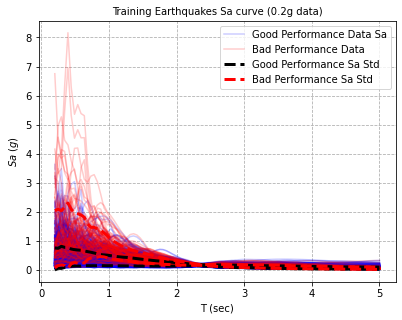

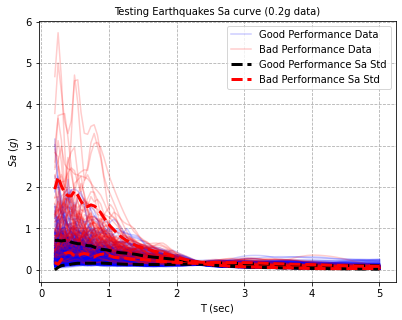

In [24]:
plt.figure(figsize=(6.4, 4.8))
plt.plot(np.linspace(0.2, 5, 100),TrainGoodSpectrum[0]/9.8,c='b',label='Good Performance Data Sa',alpha=0.2)
for i in range(1,TrainGoodSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TrainGoodSpectrum[i]/9.8,c='b',alpha=0.2)

plt.plot(np.linspace(0.2, 5, 100),TrainBadSpectrum[0]/9.8,c='r',label='Bad Performance Data',alpha=0.2)
for i in range(1,TrainBadSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TrainBadSpectrum[i]/9.8,c='r',alpha=0.2) 
plt.plot(np.linspace(0.2, 5, 100),MeanGoodTrain+TrainGoodStd,c='black',linewidth=3,linestyle='--',label='Good Performance Sa Std')
plt.plot(np.linspace(0.2, 5, 100),MeanGoodTrain-TrainGoodStd,c='black',linewidth=3,linestyle='--')
plt.plot(np.linspace(0.2, 5, 100),MeanBadTrain+TrainBadStd,c='r',linewidth=3,linestyle='--',label='Bad Performance Sa Std')
plt.plot(np.linspace(0.2, 5, 100),MeanBadTrain-TrainBadStd,c='r',linewidth=3,linestyle='--')
plt.title('Training Earthquakes Sa curve (0.2g data)',fontsize=10)
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.legend(loc = 'upper right') 
plt.grid(linestyle='--')


plt.figure(figsize=(6.4, 4.8))
plt.plot(np.linspace(0.2, 5, 100),TestGoodSpectrum[0]/9.8,c='b',label='Good Performance Data',alpha=0.2)
for i in range(1,TestGoodSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TestGoodSpectrum[i]/9.8,c='b',alpha=0.2)

plt.plot(np.linspace(0.2, 5, 100),TestBadSpectrum[0]/9.8,c='r',label='Bad Performance Data',alpha=0.2)
for i in range(1,TestBadSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TestBadSpectrum[i]/9.8,c='r',alpha=0.2)  
plt.plot(np.linspace(0.2, 5, 100),MeanGoodTest+TestGoodStd,c='black',linewidth=3,linestyle='--',label='Good Performance Sa Std')
plt.plot(np.linspace(0.2, 5, 100),MeanGoodTest-TestGoodStd,c='black',linewidth=3,linestyle='--')
plt.plot(np.linspace(0.2, 5, 100),MeanBadTest+TestBadStd,c='r',linewidth=3,linestyle='--',label='Bad Performance Sa Std')
plt.plot(np.linspace(0.2, 5, 100),MeanBadTest-TestBadStd,c='r',linewidth=3,linestyle='--')

plt.title('Testing Earthquakes Sa curve (0.2g data)',fontsize=10)
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.legend(loc = 'upper right') 
plt.grid(linestyle='--')



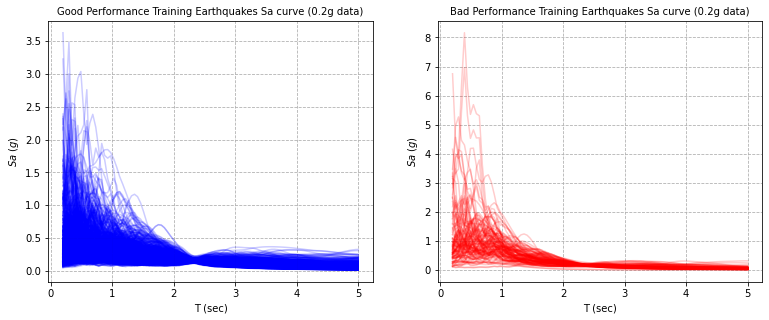

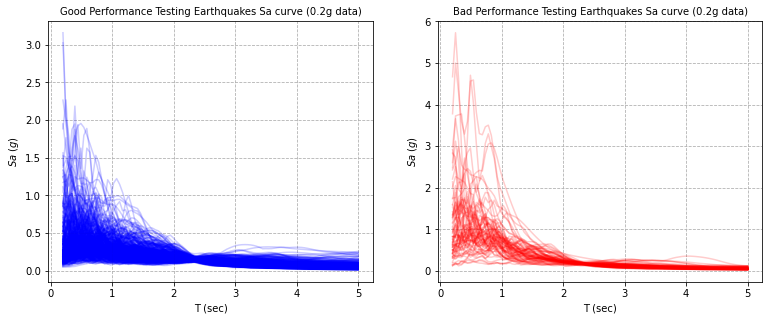

In [82]:
plt.figure(figsize=(12.8, 4.8))
plt.subplot(1, 2, 1)
for i in range(TrainGoodSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TrainGoodSpectrum[i]/9.8,c='b',alpha=0.2)
plt.title('Good Performance Training Earthquakes Sa curve (0.2g data)',fontsize=10)
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.grid(linestyle='--')

plt.subplot(1, 2, 2)
for i in range(TrainBadSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TrainBadSpectrum[i]/9.8,c='r',alpha=0.2) 
plt.title('Bad Performance Training Earthquakes Sa curve (0.2g data)',fontsize=10)
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.grid(linestyle='--')

plt.figure(figsize=(12.8, 4.8))
plt.subplot(1, 2, 1)
for i in range(TestGoodSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TestGoodSpectrum[i]/9.8,c='b',alpha=0.2)
plt.title('Good Performance Testing Earthquakes Sa curve (0.2g data)',fontsize=10)
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.grid(linestyle='--')

plt.subplot(1, 2, 2)
for i in range(TestBadSpectrum.shape[0]):
    plt.plot(np.linspace(0.2, 5, 100),TestBadSpectrum[i]/9.8,c='r',alpha=0.2)  
plt.title('Bad Performance Testing Earthquakes Sa curve (0.2g data)',fontsize=10)
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.grid(linestyle='--')



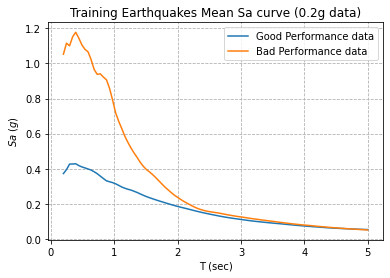

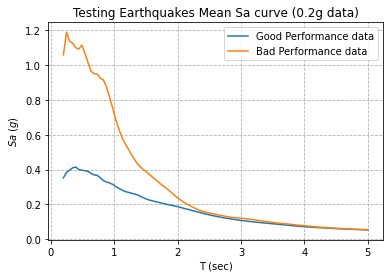

In [26]:

plt.figure()
plt.plot(np.linspace(0.2, 5, 100),MeanGoodTrain,label='Good Performance data')
plt.plot(np.linspace(0.2, 5, 100),MeanBadTrain,label='Bad Performance data')
plt.title('Training Earthquakes Mean Sa curve (0.2g data)')
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.grid(linestyle='--')
plt.legend(loc = 'upper right') 


plt.figure()
plt.plot(np.linspace(0.2, 5, 100),MeanGoodTest,label='Good Performance data')
plt.plot(np.linspace(0.2, 5, 100),MeanBadTest,label='Bad Performance data')
plt.title('Testing Earthquakes Mean Sa curve (0.2g data)')
plt.xlabel('T (sec)')
plt.ylabel('$Sa\ (g)$')
plt.grid(linestyle='--')
plt.legend(loc = 'upper right') 

In [183]:
'''def FindGoodIndex(train_name,test_name):
    Traingoodindex=[]
    Trainbadindex=[]
    Testgoodindex=[]
    Testbadindex=[]
    for i in range(train_name.shape[0]):
        if np.where(Good_name==train_name[i])[0].shape !=(0,):
            Traingoodindex.append(i)
        else:
            Trainbadindex.append(i)
    Traingoodindex = np.array(Traingoodindex)
    Trainbadindex = np.array(Trainbadindex)

    for i in range(test_name.shape[0]):
        if np.where(Good_name==test_name[i])[0].shape !=(0,):
            Testgoodindex.append(i)
        else:
            Testbadindex.append(i)  
    Testgoodindex = np.array(Testgoodindex)
    Testbadindex = np.array(Testbadindex)     

    return Traingoodindex,Trainbadindex,Testgoodindex,Testbadindex

dataDir_03g = r'E:\\我的雲端硬碟\\AI center intern\\nonlinear_seismic_response_analysis\\August\\0.3g_Earthquake\\' 
dataDir_04g = r'E:\\我的雲端硬碟\\AI center intern\\nonlinear_seismic_response_analysis\\August\\0.4g_Earthquake\\'  
mat_data_03g = scipy.io.loadmat(dataDir_03g+'NewData_Disp.mat')
mat_data_04g = scipy.io.loadmat(dataDir_04g+'NewData_Disp.mat')
name_train03g = mat_data_03g['name_train']
name_test03g = mat_data_03g['name_test']
name_train04g = mat_data_04g['name_train']
name_test04g = mat_data_04g['name_test']
Traingoodindex03g,Trainbadindex03g,Testgoodindex03g,Testbadindex03g = FindGoodIndex(name_train03g,name_test03g)
Traingoodindex04g,Trainbadindex04g,Testgoodindex04g,Testbadindex04g = FindGoodIndex(name_train04g,name_test04g)

scipy.io.savemat(dataDir_03g+'Disp03g_Index.mat',
                 { 'Traingoodindex03g': Traingoodindex03g,'Trainbadindex03g':Trainbadindex03g,'Testgoodindex03g':Testgoodindex03g,'Testbadindex03g':Testbadindex03g})
scipy.io.savemat(dataDir_04g+'Disp04g_Index.mat',
                 { 'Traingoodindex04g': Traingoodindex04g,'Trainbadindex04g':Trainbadindex04g,'Testgoodindex04g':Testgoodindex04g,'Testbadindex04g':Testbadindex04g})'''